# **PROJECT CV 3 - SEMANTIC SEGMENTATION USING FCN8s**

Dataset: Cityscapes

Supported by: Indonesia AI - Bootcamp of Computer Vision Specialist

Reference: https://www.kaggle.com/code/codelad/fcn-transfer-learning-image-segmentation/notebook

## **Import Dependencies**

In [ ]:
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import random
import seaborn as sns

from keras.models import Model
from keras.optimizers import Adam
from keras.utils import plot_model
from keras.callbacks import ModelCheckpoint
from keras.layers import Input, Conv2D, Activation, Add, Conv2DTranspose
from keras.applications.vgg16 import VGG16
from keras.models import load_model

## **Initialize Variable**

In [ ]:
train_path = '/content/drive/MyDrive/Dataset/project_cv_3_SemanticSegmentation/cityscapes_pairs_data/train'
val_path = '/content/drive/MyDrive/Dataset/project_cv_3_SemanticSegmentation/cityscapes_pairs_data/val'
width = 256
height = 256
classes = 12
batch_size = 32
num_train = len(os.listdir(train_path))
num_val = len(os.listdir(val_path))

print("Number of Training: ", num_train)
print("Number of Validation: ", num_val)

Number of Training:  2975
Number of Validation:  500


## **Load Image and Segmentation Mask**

In [ ]:
def LoadImg(filename, path):
  img = Image.open(os.path.join(path,filename))
  img = np.array(img)
  image = img[:,:256]
  mask = img[:,256:]
  return image, mask

## **Bin Segmentation Mask**

In [ ]:
def bin_img(mask):
  bins = np.array([20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240])
  new_mask = np.digitize(mask, bins)
  return new_mask

## **Segmentation Mask to Categorical Arrays**

In [ ]:
def getSegmenArr(image, classes, width=width, height=height):
  seg_labels = np.zeros((height, width, classes))
  img = image[:, :, 0]

  for i in range(classes):
    seg_labels[:, :, i] = (img == i).astype(int)

  return seg_labels

## **Categorical Arrays to Colored Segmentation Masks**

In [ ]:
def give_color_to_seg_img(seg, n_classes=12):

    seg_img = np.zeros( (seg.shape[0],seg.shape[1],3) ).astype('float')
    colors = sns.color_palette("hls", n_classes)

    for i in range(n_classes):
        segc = (seg == i)
        seg_img[:,:,0] += (segc*( colors[i][0] ))
        seg_img[:,:,1] += (segc*( colors[i][1] ))
        seg_img[:,:,2] += (segc*( colors[i][2] ))

    return(seg_img)

## **Data Generator**

In [ ]:
def DataGenerator(path, batch_size=32, classes=12):
    files = os.listdir(path)
    while True:
        for i in range(0, len(files), batch_size):
            batch_files = files[i : i+batch_size]
            imgs=[]
            segs=[]
            for file in batch_files:
                #file = random.sample(files,1)[0]
                image, mask = LoadImg(file, path)
                mask_binned = bin_img(mask)
                labels = getSegmenArr(mask_binned, classes)

                imgs.append(image)
                segs.append(labels)

            yield np.array(imgs), np.array(segs)

## **Visualize Data Samples**

In [ ]:
train_gen = DataGenerator(train_path, batch_size=batch_size)
val_gen = DataGenerator(val_path, batch_size=batch_size)

In [ ]:
imgs, segs = next(train_gen)
imgs.shape, segs.shape

((32, 256, 256, 3), (32, 256, 256, 12))

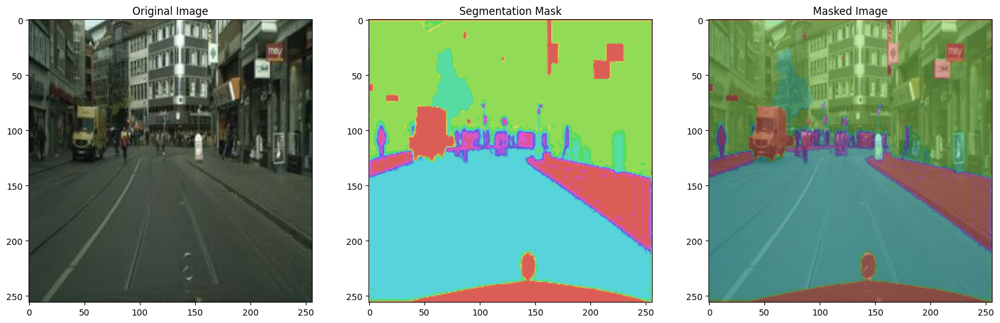

In [ ]:
image = imgs[0]
mask = give_color_to_seg_img(np.argmax(segs[0], axis=-1))
masked_image = cv2.addWeighted(image/255, 0.5, mask, 0.5, 0)

fig, axs = plt.subplots(1, 3, figsize=(20,20))
axs[0].imshow(image)
axs[0].set_title('Original Image')
axs[1].imshow(mask)
axs[1].set_title('Segmentation Mask')
#predimg = cv2.addWeighted(imgs[i]/255, 0.6, _p, 0.4, 0)
axs[2].imshow(masked_image)
axs[2].set_title('Masked Image')
plt.show()

## **Segmentation Model - FCN+Transfer Learning**

In [ ]:
def fcn(vgg, classes = 12, fcn8 = False, fcn16 = False):
    pool5 = vgg.get_layer('block5_pool').output
    pool4 = vgg.get_layer('block4_pool').output
    pool3 = vgg.get_layer('block3_pool').output

    conv_6 = Conv2D(1024, (7, 7), activation='relu', padding='same', name="conv_6")(pool5)
    conv_7 = Conv2D(1024, (1, 1), activation='relu', padding='same', name="conv_7")(conv_6)

    conv_8 = Conv2D(classes, (1, 1), activation='relu', padding='same', name="conv_8")(pool4)
    conv_9 = Conv2D(classes, (1, 1), activation='relu', padding='same', name="conv_9")(pool3)

    deconv_7 = Conv2DTranspose(classes, kernel_size=(2,2), strides=(2,2))(conv_7)
    add_1 = Add()([deconv_7, conv_8])
    deconv_8 = Conv2DTranspose(classes, kernel_size=(2,2), strides=(2,2))(add_1)
    add_2 = Add()([deconv_8, conv_9])
    deconv_9 = Conv2DTranspose(classes, kernel_size=(8,8), strides=(8,8))(add_2)

    if fcn8 :
        output_layer = Activation('softmax')(deconv_9)
    elif fcn16 :
        deconv_10 = Conv2DTranspose(classes, kernel_size=(16,16), strides=(16,16))(add_1)
        output_layer = Activation('softmax')(deconv_10)
    else :
        deconv_11 = Conv2DTranspose(classes, kernel_size=(32,32), strides=(32,32))(conv_7)
        output_layer = Activation('softmax')(deconv_11)

    model = Model(inputs=vgg.input, outputs=output_layer)
    return model

In [ ]:
vgg = VGG16(include_top=False, weights='imagenet', input_shape=(width, height, 3))

In [ ]:
model = fcn(vgg, fcn8=True)
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 256, 256, 64)         1792      ['input_4[0][0]']             
                                                                                                  
 block1_conv2 (Conv2D)       (None, 256, 256, 64)         36928     ['block1_conv1[0][0]']        
                                                                                                  
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)         0         ['block1_conv2[0][0]']        
                                                                                            

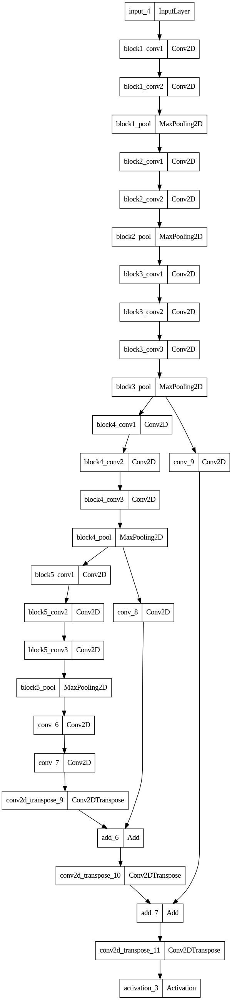

In [ ]:
plot_model(model)

## **Train The Model**

### Experiment 1

In [ ]:
adam = Adam(learning_rate=0.0001, weight_decay=0.001)
model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])

In [ ]:
#filepath = '/content/best_model_vgg16_backbone.h5'
#checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
#callbacks_list = [checkpoint]

In [ ]:
history = model.fit(train_gen, epochs=15, steps_per_epoch=num_train//batch_size,
                    validation_data=val_gen, validation_steps=num_val//batch_size)

Epoch 1/15
92/92 [==============================] - 146s 1s/step - loss: 3.9631 - accuracy: 0.1064 - val_loss: 2.3896 - val_accuracy: 0.1194
Epoch 2/15
92/92 [==============================] - 84s 915ms/step - loss: 2.3582 - accuracy: 0.1296 - val_loss: 2.3665 - val_accuracy: 0.1449
Epoch 3/15
92/92 [==============================] - 73s 793ms/step - loss: 2.3130 - accuracy: 0.1630 - val_loss: 2.2724 - val_accuracy: 0.1956
Epoch 4/15
92/92 [==============================] - 72s 783ms/step - loss: 2.0619 - accuracy: 0.2890 - val_loss: 1.8193 - val_accuracy: 0.3907
Epoch 5/15
92/92 [==============================] - 72s 786ms/step - loss: 1.6302 - accuracy: 0.4455 - val_loss: 1.5183 - val_accuracy: 0.4802
Epoch 6/15
92/92 [==============================] - 73s 790ms/step - loss: 1.4035 - accuracy: 0.5042 - val_loss: 1.3772 - val_accuracy: 0.5087
Epoch 7/15
92/92 [==============================] - 83s 906ms/step - loss: 1.2987 - accuracy: 0.5388 - val_loss: 1.2908 - val_accuracy: 0.5436
E

### Experiment 2

In [ ]:
adam = Adam(learning_rate=0.0001, weight_decay=0.0001)
model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])

In [ ]:
history = model.fit(train_gen, epochs=15, steps_per_epoch=num_train//batch_size,
                    validation_data=val_gen, validation_steps=num_val//batch_size)

Epoch 1/15
92/92 [==============================] - 103s 1s/step - loss: 4.3906 - accuracy: 0.1069 - val_loss: 2.3786 - val_accuracy: 0.1181
Epoch 2/15
92/92 [==============================] - 75s 814ms/step - loss: 2.3439 - accuracy: 0.1322 - val_loss: 2.3399 - val_accuracy: 0.1484
Epoch 3/15
92/92 [==============================] - 72s 789ms/step - loss: 2.2599 - accuracy: 0.1812 - val_loss: 2.1748 - val_accuracy: 0.2253
Epoch 4/15
92/92 [==============================] - 73s 791ms/step - loss: 1.9759 - accuracy: 0.2977 - val_loss: 1.8180 - val_accuracy: 0.3591
Epoch 5/15
92/92 [==============================] - 82s 898ms/step - loss: 1.7476 - accuracy: 0.3636 - val_loss: 1.7191 - val_accuracy: 0.3654
Epoch 6/15
92/92 [==============================] - 73s 796ms/step - loss: 1.6698 - accuracy: 0.3673 - val_loss: 1.6455 - val_accuracy: 0.3812
Epoch 7/15
92/92 [==============================] - 74s 802ms/step - loss: 1.5917 - accuracy: 0.3899 - val_loss: 1.5669 - val_accuracy: 0.4110
E

### Experiment 3

In [ ]:
adam = Adam(learning_rate=0.0001, weight_decay=0.00001)
model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])

In [ ]:
history = model.fit(train_gen, epochs=15, steps_per_epoch=num_train//batch_size,
                    validation_data=val_gen, validation_steps=num_val//batch_size)

Epoch 1/15
92/92 [==============================] - 86s 840ms/step - loss: 4.9702 - accuracy: 0.1154 - val_loss: 2.3858 - val_accuracy: 0.1267
Epoch 2/15
92/92 [==============================] - 72s 788ms/step - loss: 2.3557 - accuracy: 0.1406 - val_loss: 2.3606 - val_accuracy: 0.1467
Epoch 3/15
92/92 [==============================] - 73s 799ms/step - loss: 2.2987 - accuracy: 0.1736 - val_loss: 2.2361 - val_accuracy: 0.2165
Epoch 4/15
92/92 [==============================] - 73s 791ms/step - loss: 2.0345 - accuracy: 0.3000 - val_loss: 1.8388 - val_accuracy: 0.3890
Epoch 5/15
92/92 [==============================] - 76s 824ms/step - loss: 1.6924 - accuracy: 0.4390 - val_loss: 1.5920 - val_accuracy: 0.4864
Epoch 6/15
92/92 [==============================] - 74s 808ms/step - loss: 1.4428 - accuracy: 0.5209 - val_loss: 1.4203 - val_accuracy: 0.5266
Epoch 7/15
92/92 [==============================] - 74s 808ms/step - loss: 1.3280 - accuracy: 0.5420 - val_loss: 1.3595 - val_accuracy: 0.5421

### Experiment 4

In [ ]:
adam = Adam(learning_rate=0.0001, weight_decay=0.01)
model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])

In [ ]:
history = model.fit(train_gen, epochs=15, steps_per_epoch=num_train//batch_size,
                    validation_data=val_gen, validation_steps=num_val//batch_size)

Epoch 1/15
92/92 [==============================] - 91s 921ms/step - loss: 4.3861 - accuracy: 0.1112 - val_loss: 2.3881 - val_accuracy: 0.1207
Epoch 2/15
92/92 [==============================] - 74s 811ms/step - loss: 2.3571 - accuracy: 0.1312 - val_loss: 2.3651 - val_accuracy: 0.1372
Epoch 3/15
92/92 [==============================] - 85s 923ms/step - loss: 2.3111 - accuracy: 0.1551 - val_loss: 2.2833 - val_accuracy: 0.1750
Epoch 4/15
92/92 [==============================] - 77s 834ms/step - loss: 2.1492 - accuracy: 0.2234 - val_loss: 2.0060 - val_accuracy: 0.2879
Epoch 5/15
92/92 [==============================] - 74s 805ms/step - loss: 1.7531 - accuracy: 0.3832 - val_loss: 1.5820 - val_accuracy: 0.4571
Epoch 6/15
92/92 [==============================] - 74s 801ms/step - loss: 1.4563 - accuracy: 0.5017 - val_loss: 1.4190 - val_accuracy: 0.5158
Epoch 7/15
92/92 [==============================] - 75s 813ms/step - loss: 1.3248 - accuracy: 0.5380 - val_loss: 1.3148 - val_accuracy: 0.5340

## **Validation and Evaluation**

### Experiment 1

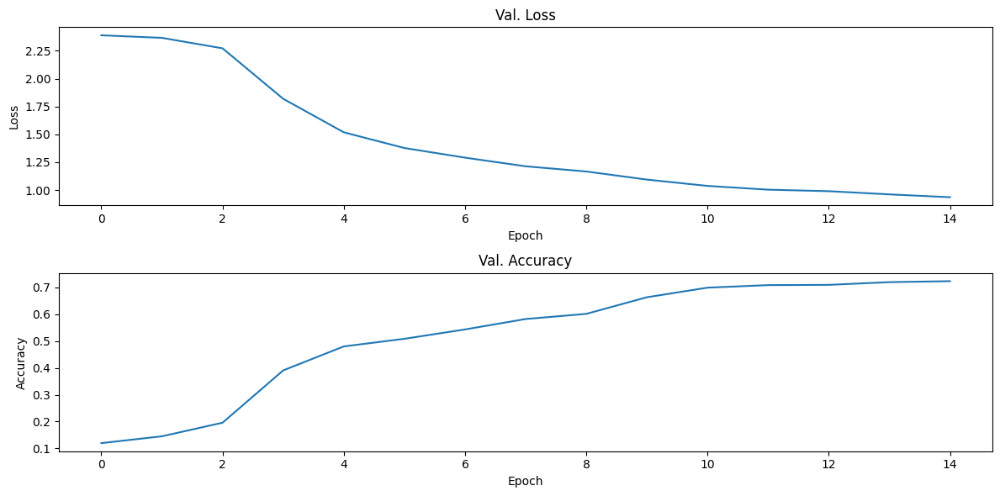

In [ ]:
loss = history.history["val_loss"]
acc = history.history["val_accuracy"] #accuracy

plt.figure(figsize=(12, 6))
plt.subplot(211)
plt.title("Val. Loss")
plt.plot(loss)
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(212)
plt.title("Val. Accuracy")
plt.plot(acc)
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.tight_layout()
#plt.savefig("learn.png", dpi=150)
plt.show()

1/1 [==============================] - 0s 356ms/step


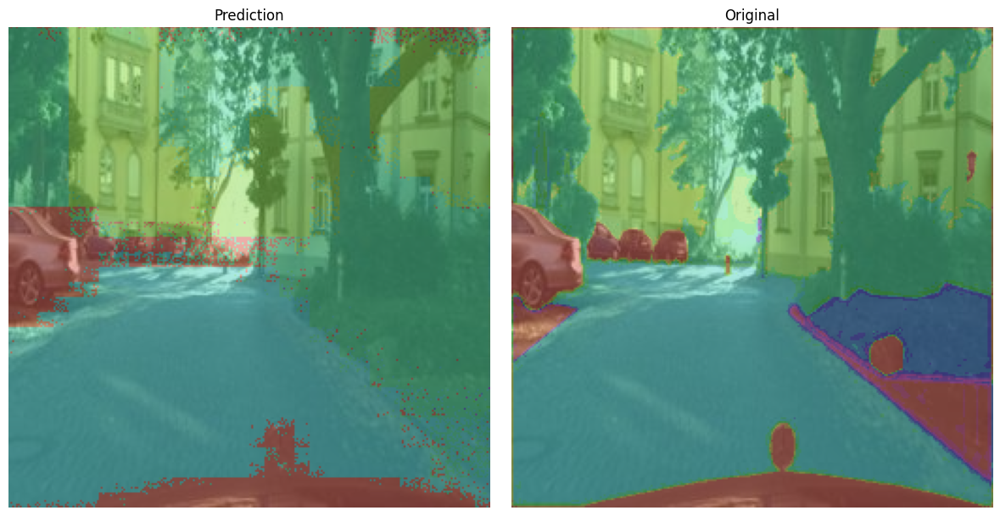

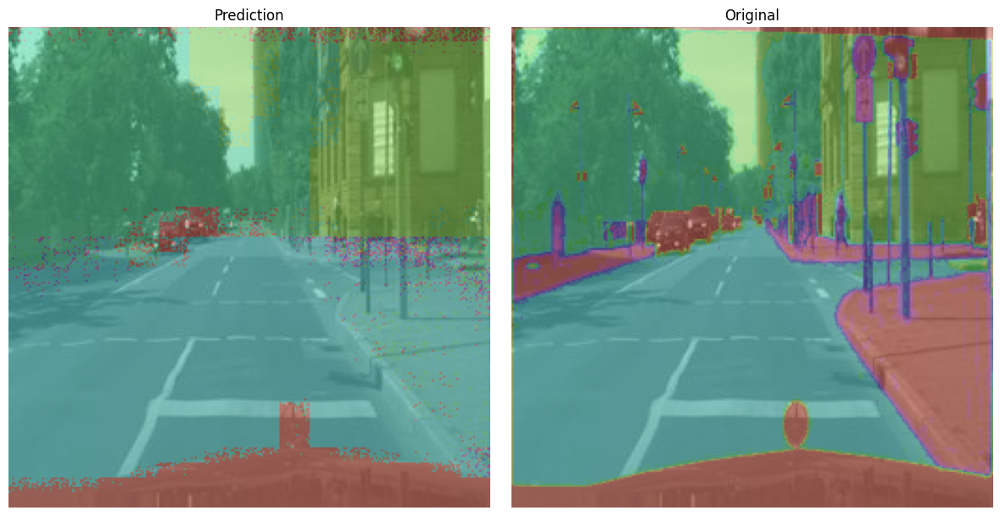

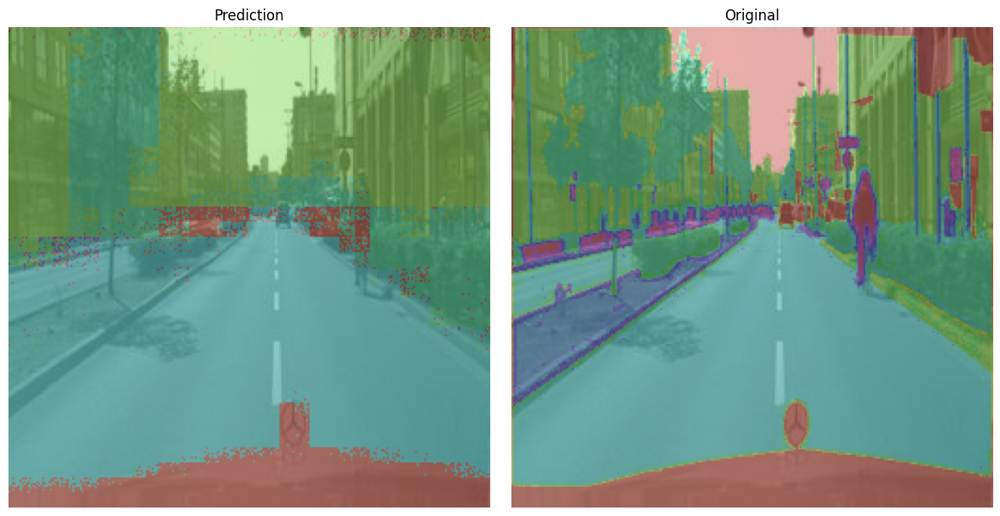

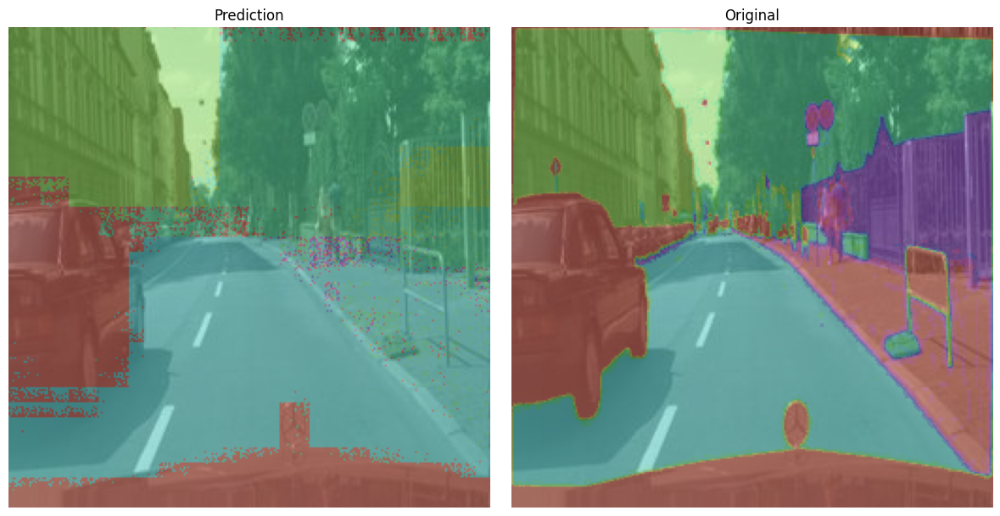

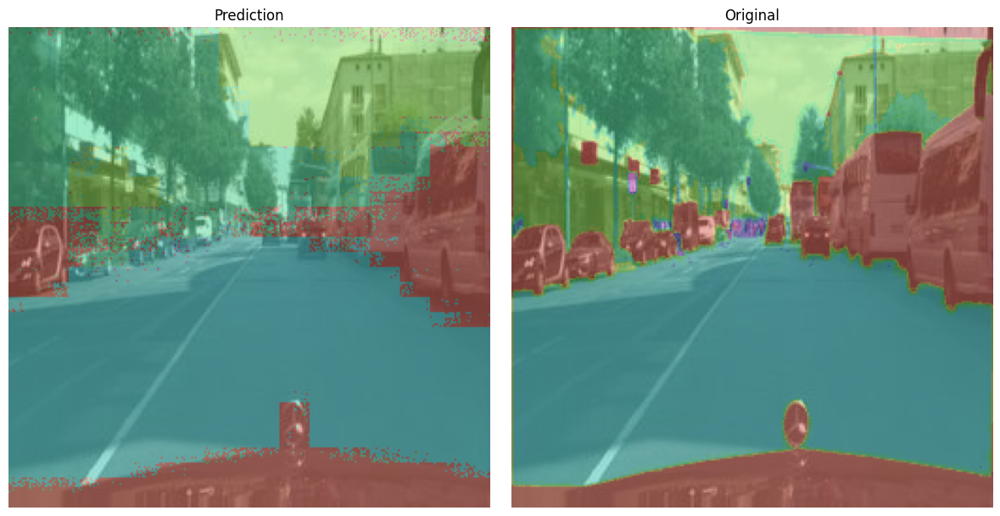

In [ ]:
#val_gen = DataGenerator(valid_folder)
max_show = 5
imgs, segs = next(val_gen)
pred = model.predict(imgs)

for i in range(max_show):
    _p = give_color_to_seg_img(np.argmax(pred[i], axis=-1))
    _s = give_color_to_seg_img(np.argmax(segs[i], axis=-1))

    predimg = cv2.addWeighted(imgs[i]/255, 0.5, _p, 0.5, 0)
    trueimg = cv2.addWeighted(imgs[i]/255, 0.5, _s, 0.5, 0)

    plt.figure(figsize=(12,6))
    plt.subplot(121)
    plt.title("Prediction")
    plt.imshow(predimg)
    plt.axis("off")
    plt.subplot(122)
    plt.title("Original")
    plt.imshow(trueimg)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig("pred_"+str(i)+".png", dpi=150)
    plt.show()

In [ ]:
#model_save_path = '/content/model_fcn8s_vgg16_1.keras'
#model.save(model_save_path)

### Experiment 2

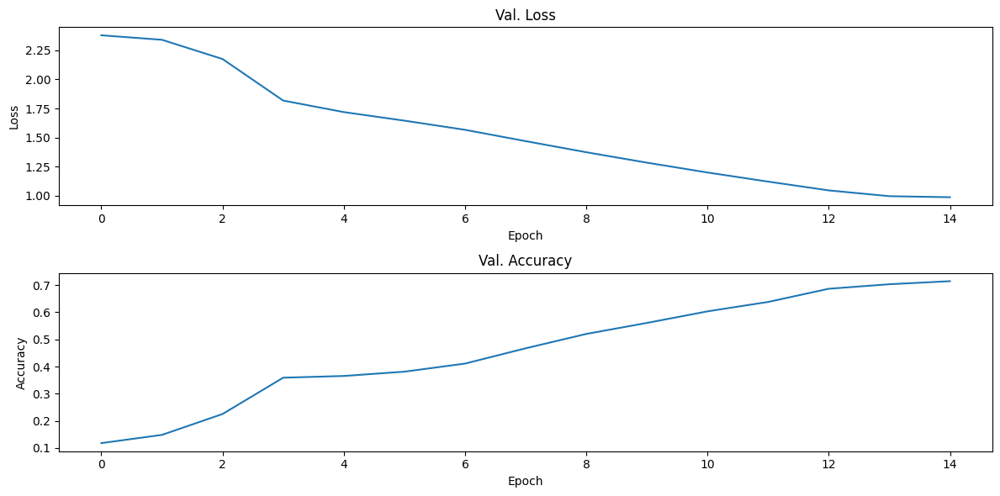

In [ ]:
loss = history.history["val_loss"]
acc = history.history["val_accuracy"] #accuracy

plt.figure(figsize=(12, 6))
plt.subplot(211)
plt.title("Val. Loss")
plt.plot(loss)
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(212)
plt.title("Val. Accuracy")
plt.plot(acc)
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.tight_layout()
#plt.savefig("learn.png", dpi=150)
plt.show()

1/1 [==============================] - 0s 197ms/step


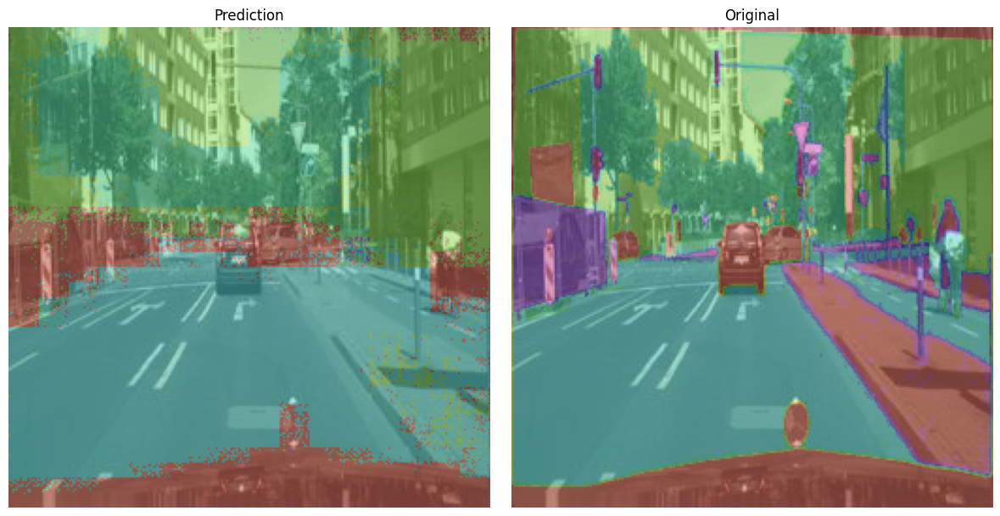

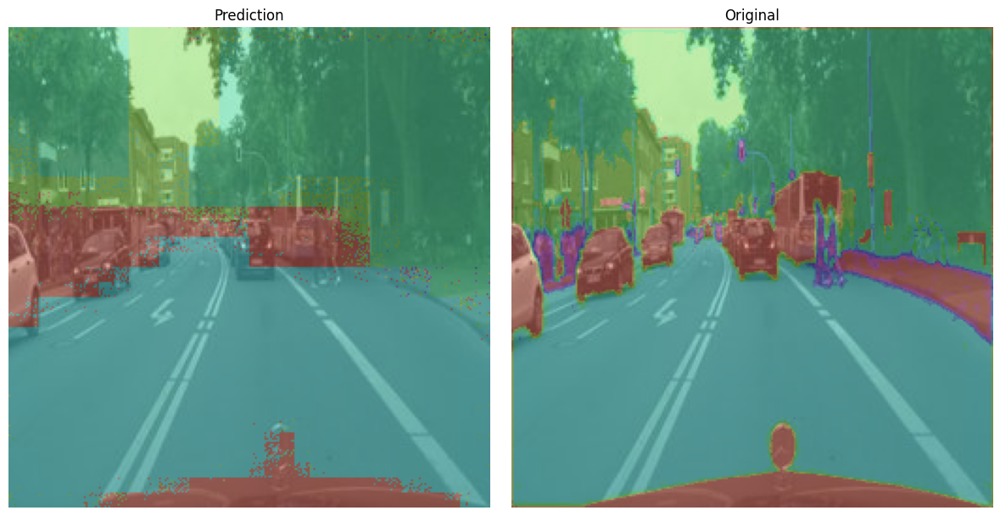

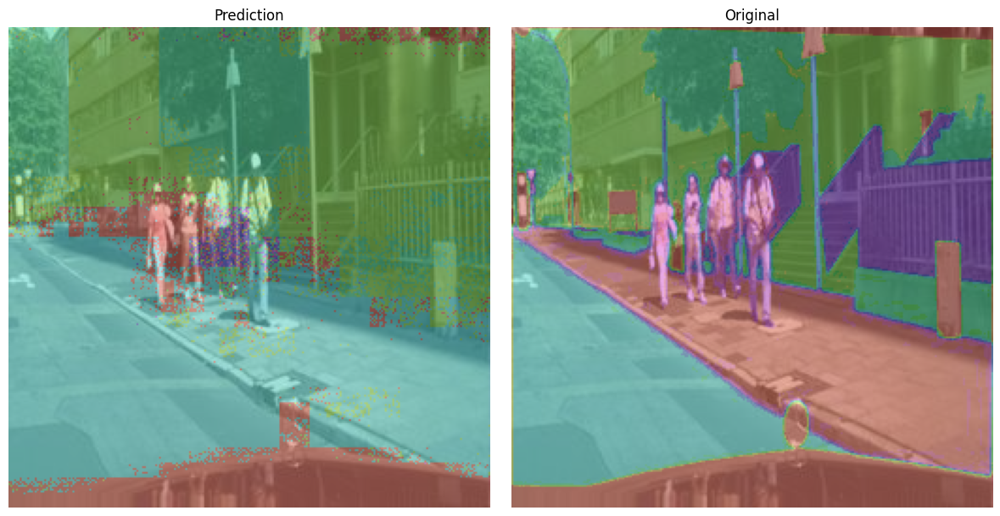

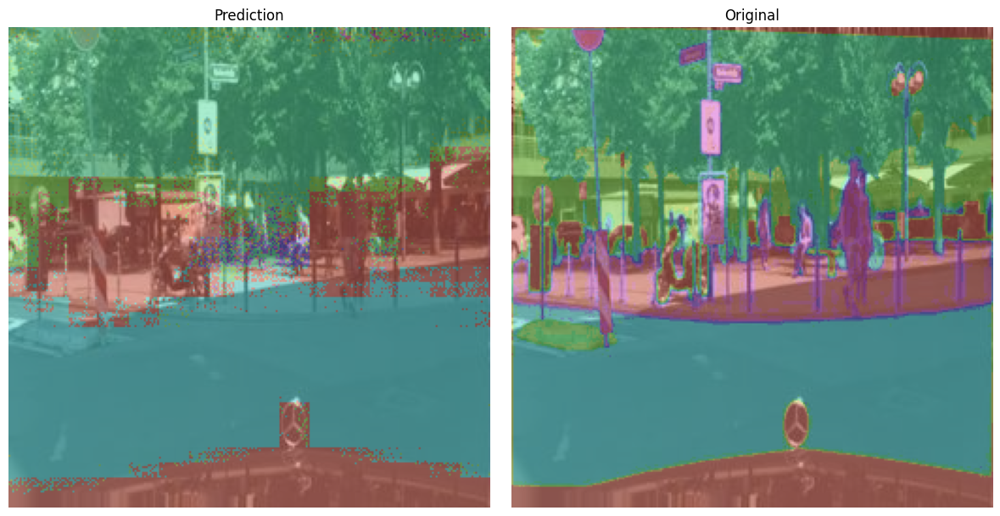

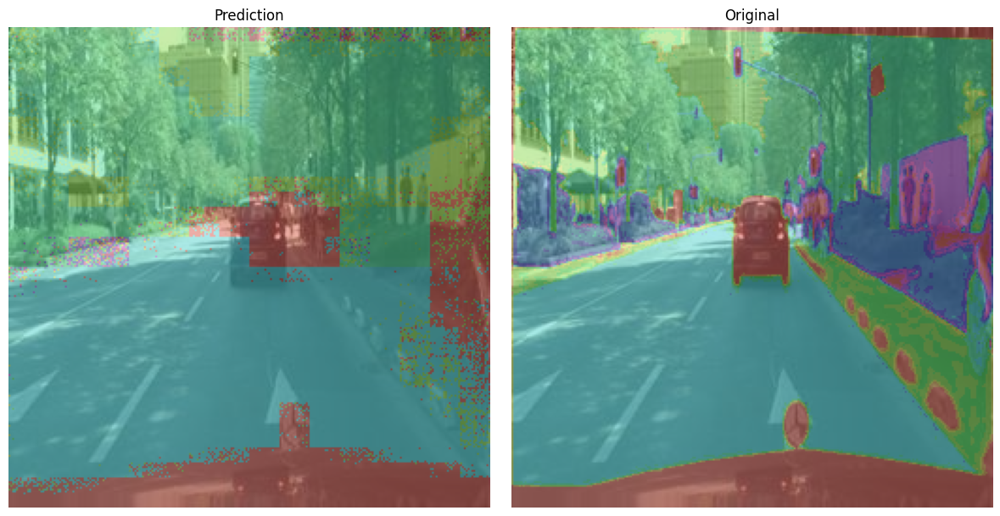

In [ ]:
#val_gen = DataGenerator(valid_folder)
max_show = 5
imgs, segs = next(val_gen)
pred = model.predict(imgs)

for i in range(max_show):
    _p = give_color_to_seg_img(np.argmax(pred[i], axis=-1))
    _s = give_color_to_seg_img(np.argmax(segs[i], axis=-1))

    predimg = cv2.addWeighted(imgs[i]/255, 0.5, _p, 0.5, 0)
    trueimg = cv2.addWeighted(imgs[i]/255, 0.5, _s, 0.5, 0)

    plt.figure(figsize=(12,6))
    plt.subplot(121)
    plt.title("Prediction")
    plt.imshow(predimg)
    plt.axis("off")
    plt.subplot(122)
    plt.title("Original")
    plt.imshow(trueimg)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig("pred_"+str(i)+".png", dpi=150)
    plt.show()

In [ ]:
#model_save_path = '/content/model_fcn8s_vgg16_2.keras'
#model.save(model_save_path)

### Experiment 3

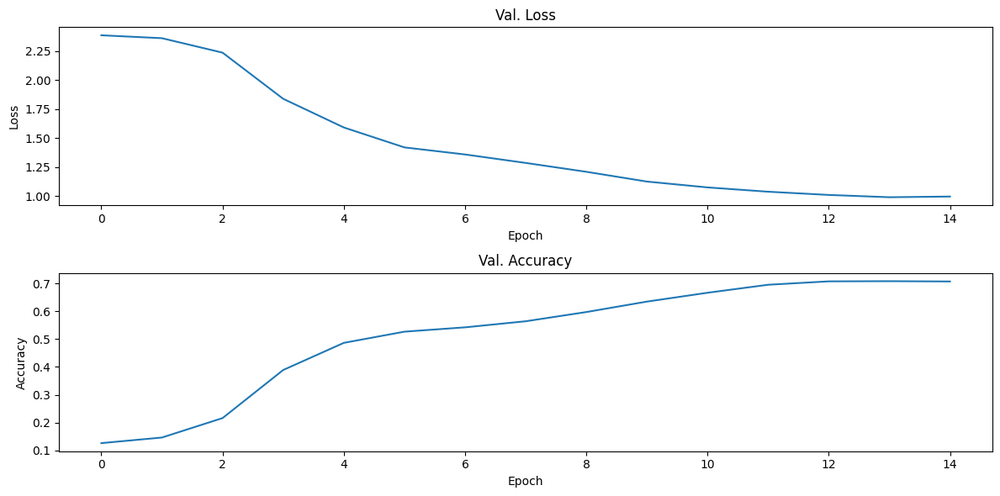

In [ ]:
loss = history.history["val_loss"]
acc = history.history["val_accuracy"] #accuracy

plt.figure(figsize=(12, 6))
plt.subplot(211)
plt.title("Val. Loss")
plt.plot(loss)
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(212)
plt.title("Val. Accuracy")
plt.plot(acc)
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.tight_layout()
#plt.savefig("learn.png", dpi=150)
plt.show()

1/1 [==============================] - 0s 28ms/step


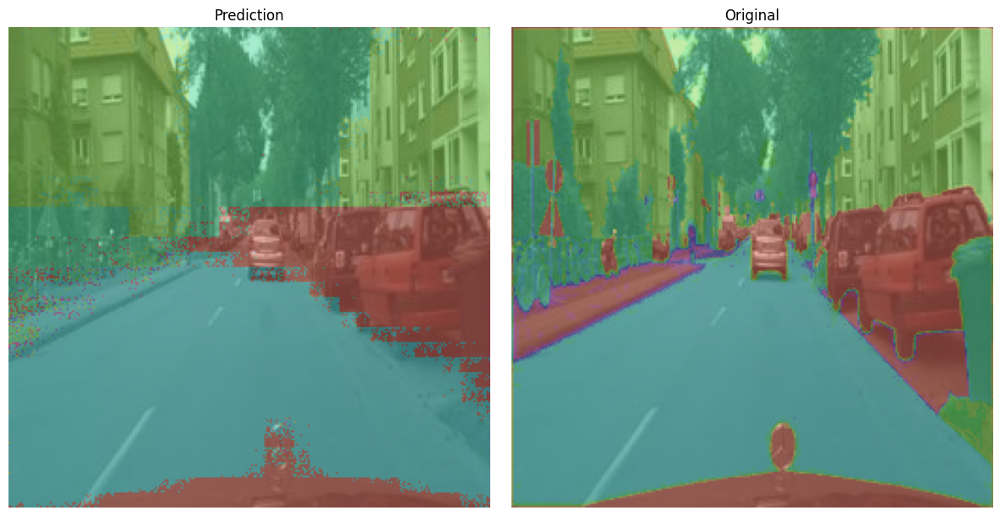

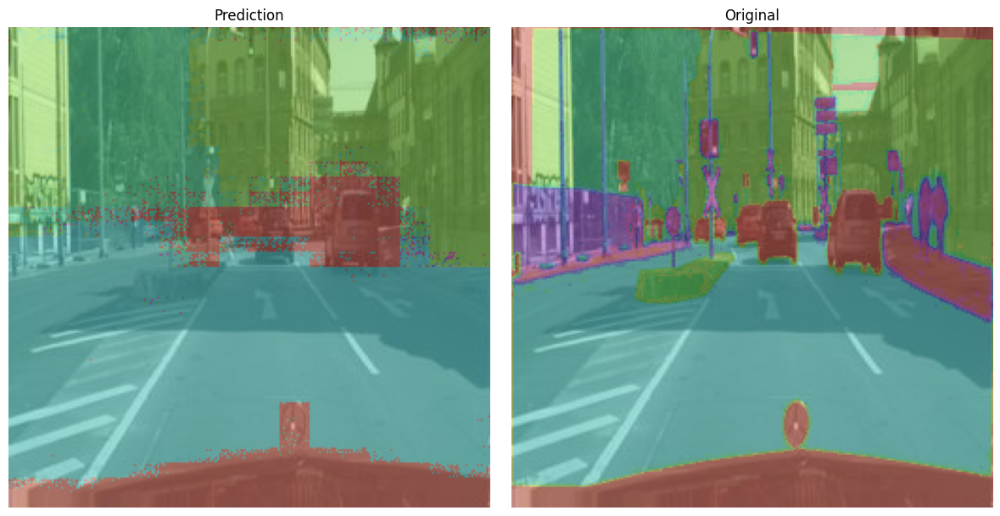

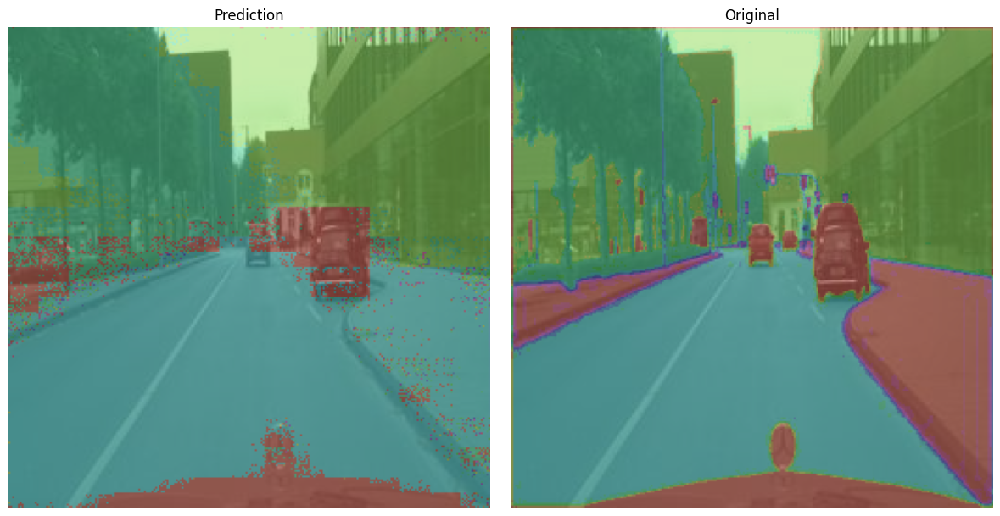

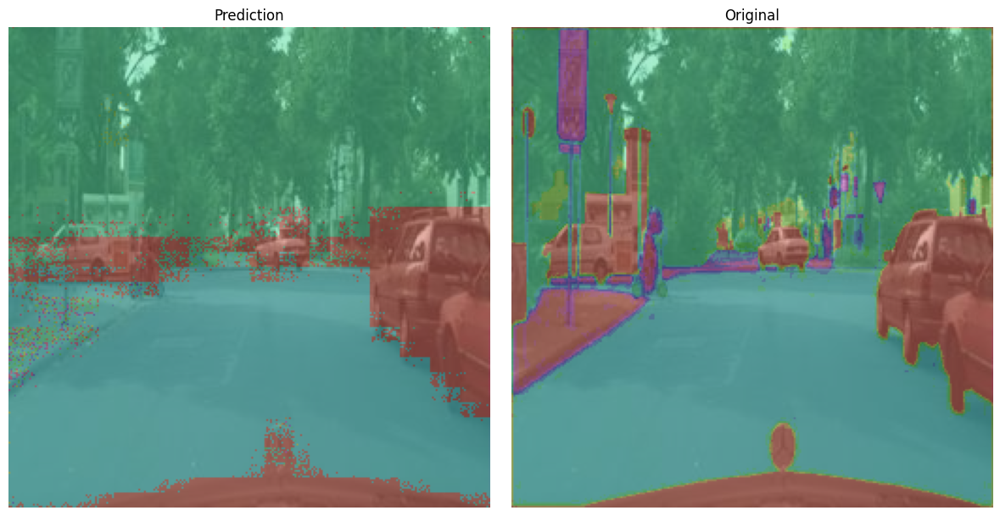

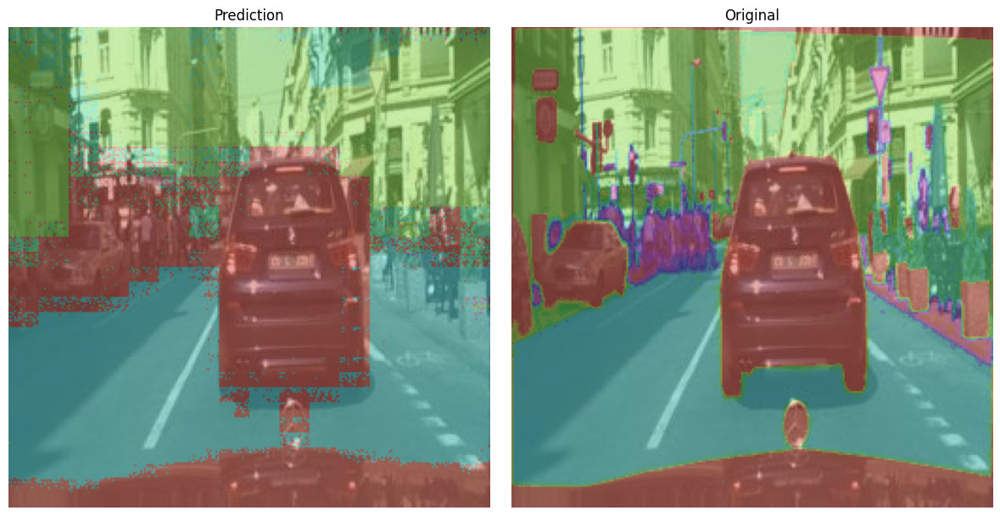

In [ ]:
#val_gen = DataGenerator(valid_folder)
max_show = 5
imgs, segs = next(val_gen)
pred = model.predict(imgs)

for i in range(max_show):
    _p = give_color_to_seg_img(np.argmax(pred[i], axis=-1))
    _s = give_color_to_seg_img(np.argmax(segs[i], axis=-1))

    predimg = cv2.addWeighted(imgs[i]/255, 0.5, _p, 0.5, 0)
    trueimg = cv2.addWeighted(imgs[i]/255, 0.5, _s, 0.5, 0)

    plt.figure(figsize=(12,6))
    plt.subplot(121)
    plt.title("Prediction")
    plt.imshow(predimg)
    plt.axis("off")
    plt.subplot(122)
    plt.title("Original")
    plt.imshow(trueimg)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig("pred_"+str(i)+".png", dpi=150)
    plt.show()

In [ ]:
#model_save_path = '/content/model_fcn8s_vgg16_3.keras'
#model.save(model_save_path)

### Experiment 4

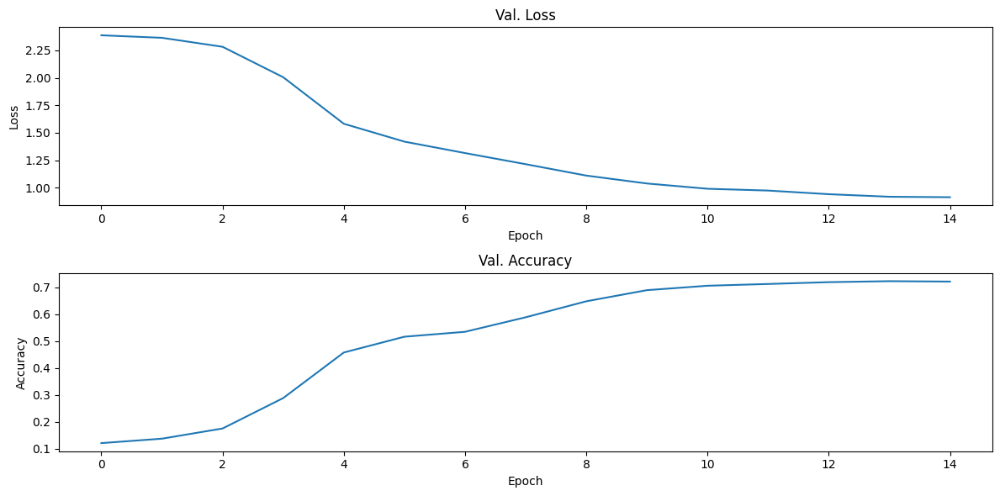

In [ ]:
loss = history.history["val_loss"]
acc = history.history["val_accuracy"] #accuracy

plt.figure(figsize=(12, 6))
plt.subplot(211)
plt.title("Val. Loss")
plt.plot(loss)
plt.xlabel("Epoch")
plt.ylabel("Loss")

plt.subplot(212)
plt.title("Val. Accuracy")
plt.plot(acc)
plt.xlabel("Epoch")
plt.ylabel("Accuracy")

plt.tight_layout()
#plt.savefig("learn.png", dpi=150)
plt.show()

1/1 [==============================] - 0s 187ms/step


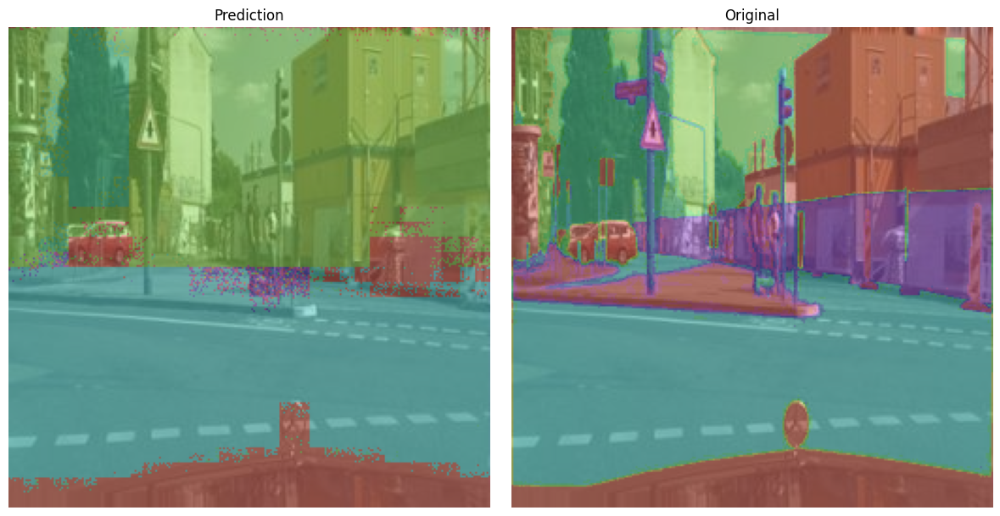

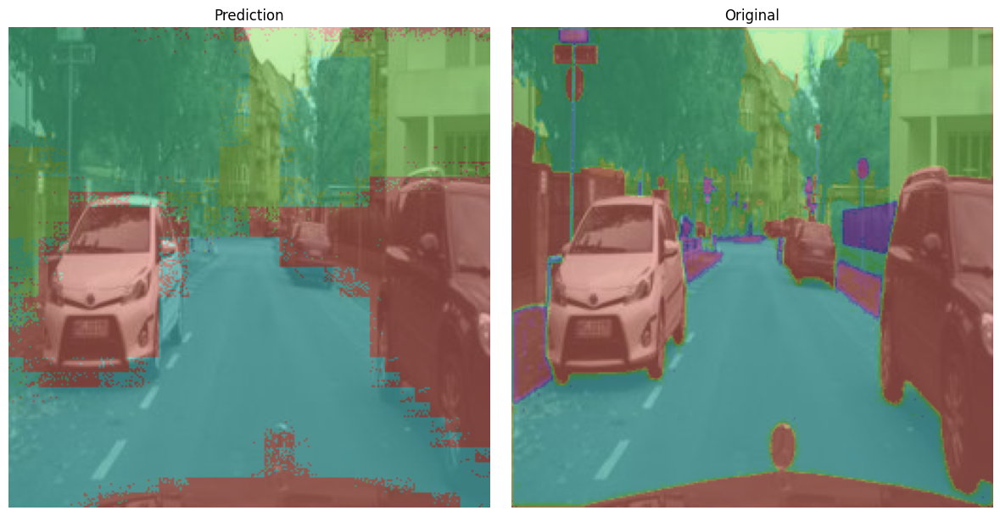

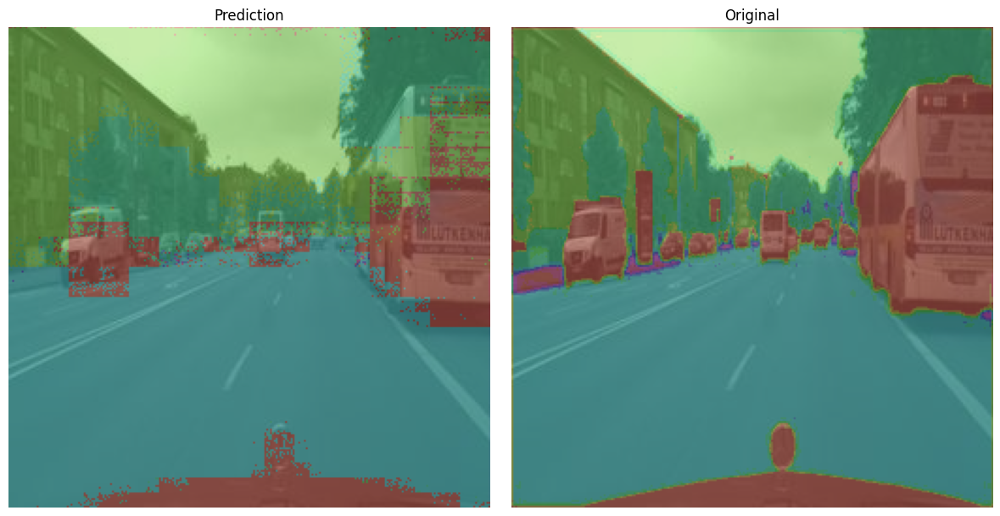

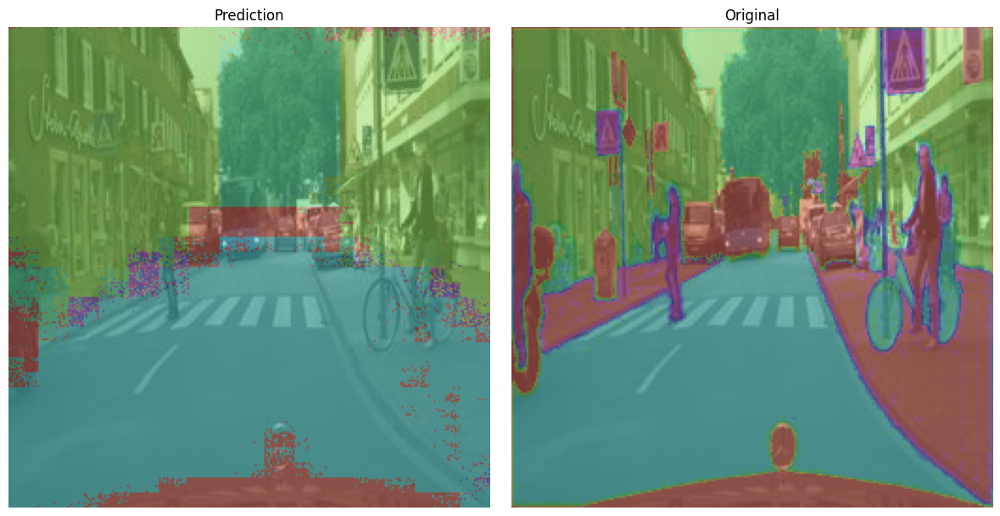

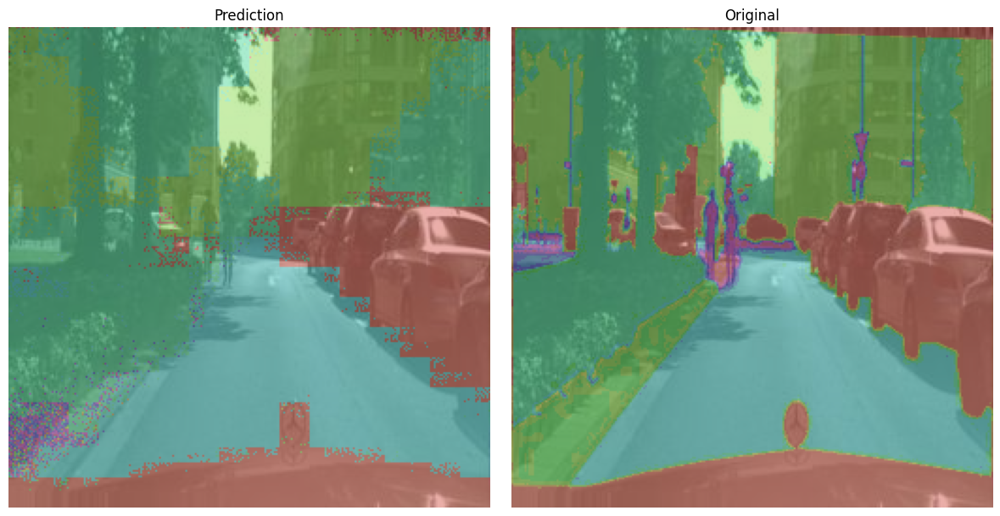

In [ ]:
#val_gen = DataGenerator(valid_folder)
max_show = 5
imgs, segs = next(val_gen)
pred = model.predict(imgs)

for i in range(max_show):
    _p = give_color_to_seg_img(np.argmax(pred[i], axis=-1))
    _s = give_color_to_seg_img(np.argmax(segs[i], axis=-1))

    predimg = cv2.addWeighted(imgs[i]/255, 0.5, _p, 0.5, 0)
    trueimg = cv2.addWeighted(imgs[i]/255, 0.5, _s, 0.5, 0)

    plt.figure(figsize=(12,6))
    plt.subplot(121)
    plt.title("Prediction")
    plt.imshow(predimg)
    plt.axis("off")
    plt.subplot(122)
    plt.title("Original")
    plt.imshow(trueimg)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig("pred_"+str(i)+".png", dpi=150)
    plt.show()

In [ ]:
#model_save_path = '/content/model_fcn8s_vgg16_4.keras'
#model.save(model_save_path)

## **Implement Model to Video**

In [ ]:
model = load_model('')